This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [2]:
!pip install pytorch_lightning
!pip install seaborn

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
from sklearn.utils import shuffle
from PIL import Image

print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [4]:
train_path_kaggle = "/kaggle/input/archive/archive/train"
test_path_kaggle = "/kaggle/input/archive/archive/test"
valid_path_kaggle = "/kaggle/input/archive/archive/valid"

train_path_drive = "/content/drive/MyDrive/archive/train"
test_path_drive = "/content/drive/MyDrive/archive/test"
valid_path_drive = "/content/drive/MyDrive/archive/valid"

In [5]:
import os
import pandas as pd
from tqdm import tqdm

def load_data(PATH):
    # TODO: Initialize lists to store filenames and their corresponding outcomes
    filenames = []
    outcomes = []

    # TODO: Create a DataFrame from the filenames and outcomes
    for folder in tqdm(os.listdir(PATH), desc='Loading Data'):
      folder_path = os.path.join(PATH, folder)
      if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
          filenames.append(os.path.join(folder, file))
          outcomes.append(folder)

    df = pd.DataFrame({"filename": filenames, "outcome": outcomes})
    # TODO: Return the shuffled DataFrame
    return shuffle(df, random_state=42)

# TODO: Load the training, validation, and test data using the load_data function
# train_data = load_data("/content/drive/MyDrive/archive/train")
# val_data = load_data("/content/drive/MyDrive/archive/valid")
# test_data = load_data("/content/drive/MyDrive/archive/test")
train_data = load_data(train_path_kaggle)
val_data = load_data(valid_path_kaggle)
test_data = load_data(test_path_kaggle)

# TODO: Check the shape of the loaded DataFrames to verify correct data loading
print(f'\n\n train shape: {train_data.shape}')
print(f'validation shape: {val_data.shape}')
print(f'test shape: {test_data.shape}')

Loading Data: 100%|██████████| 20/20 [00:00<00:00, 170.36it/s]



 train shape: (3208, 2)
validation shape: (100, 2)
test shape: (100, 2)


In [6]:

import os
import pandas as pd
from sklearn.utils import shuffle
from tqdm import tqdm

def load_data(PATH):
    """
    Loads image data from a specified path and returns a shuffled DataFrame.

    Args:
        PATH (str): The directory path containing the dataset.

    Returns:
        pd.DataFrame: A DataFrame containing image filenames and their associated labels.
    """
    filenames = []
    outcomes = []

    for root, dirs, files in os.walk(PATH):
        for file in tqdm(files, desc=f"Processing files in {PATH}"):
            if file.endswith(('.png', '.jpg', '.jpeg')):  
                filenames.append(os.path.join(root, file))
                outcomes.append(os.path.basename(root))

    data = pd.DataFrame({
        'filename': filenames,
        'outcome': outcomes
    })

    data = shuffle(data).reset_index(drop=True)

    return data

dataset_paths = {
    'train': "/kaggle/input/archive/archive/train",
    'val': "/kaggle/input/archive/archive/valid",
    'test': "/kaggle/input/archive/archive/test"
}

train_data = load_data(dataset_paths['train'])
val_data = load_data(dataset_paths['val'])
test_data = load_data(dataset_paths['test'])

print("Training data shape:", train_data.shape)
print("Validation data shape:", val_data.shape)
print("Test data shape:", test_data.shape)

Processing files in /kaggle/input/archive/archive/train: 0it [00:00, ?it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 155/155 [00:00<00:00, 405057.40it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 133/133 [00:00<00:00, 327949.70it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 179/179 [00:00<00:00, 277245.35it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 179/179 [00:00<00:00, 226138.68it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 161/161 [00:00<00:00, 229844.43it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 154/154 [00:00<00:00, 246441.36it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 133/133 [00:00<00:00, 339320.21it/s]
Processing files in /kaggle/input/archive/archive/train: 100%|██████████| 170/170 [00:00<00:00, 363791.67it/s]
Processing files in /kaggle/input/ar

Training data shape: (3208, 2)
Validation data shape: (100, 2)
Test data shape: (100, 2)


In [7]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
combined_data = pd.concat([train_data, test_data], axis=0)

combined_data.shape

(3308, 2)

In [8]:
# TODO: Explore the new DataFrame

In [9]:
combined_data

,filename,outcome
0,/kaggle/input/archive/archive/train/ALBERTS TO...,ALBERTS TOWHEE
1,/kaggle/input/archive/archive/train/AMERICAN A...,AMERICAN AVOCET
2,/kaggle/input/archive/archive/train/AFRICAN PY...,AFRICAN PYGMY GOOSE
3,/kaggle/input/archive/archive/train/AMERICAN K...,AMERICAN KESTREL
4,/kaggle/input/archive/archive/train/AMERICAN A...,AMERICAN AVOCET
...,...,...
95,/kaggle/input/archive/archive/test/AMERICAN CO...,AMERICAN COOT
96,/kaggle/input/archive/archive/test/AFRICAN OYS...,AFRICAN OYSTER CATCHER
97,/kaggle/input/archive/archive/test/ABYSSINIAN ...,ABYSSINIAN GROUND HORNBILL
98,/kaggle/input/archive/archive/test/AMERICAN AV...,AMERICAN AVOCET


## Plot some of the images

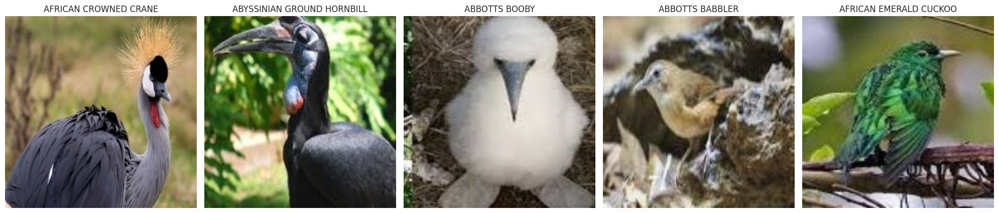

In [10]:
# TODO: Plot some of images
num_images = 5
sample_df = combined_data.sample(num_images, random_state=42)
fig, axes = plt.subplots(1, num_images, figsize=(20, 5))


for i, (idx, row) in enumerate(sample_df.iterrows()):
        # image_path = os.path.join('/content/drive/MyDrive/archive/train', row['filename'])
        image_path = os.path.join(train_path_kaggle, row['filename'])
        image = Image.open(image_path)
        axes[i].imshow(image)
        axes[i].set_title(f"{row['outcome']}")
        axes[i].axis('off')


plt.tight_layout()
plt.show()

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

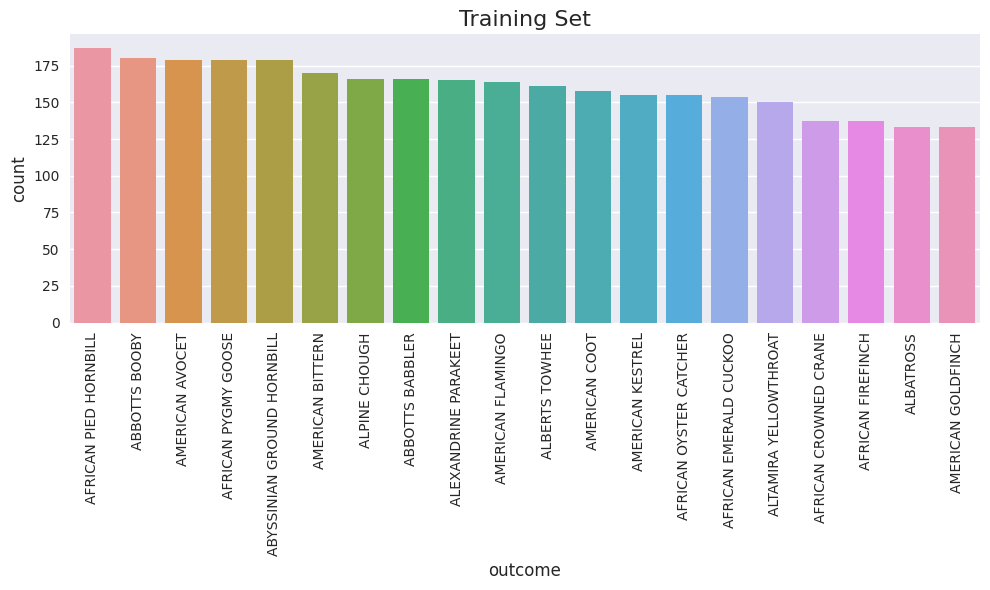

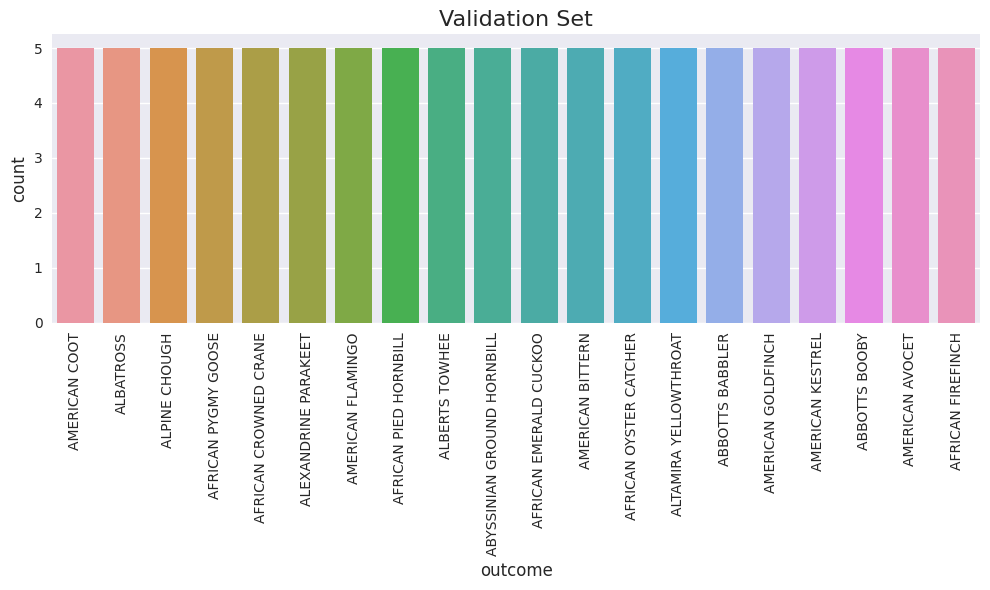

In [11]:
# TODO: Plot the distribution of classes

def plot_label_distribution(data, title):
    label_counts = data['outcome'].value_counts()
    plt.figure(figsize=(10, 6))
    sea.barplot(x=label_counts.index, y=label_counts.values)
    plt.title(title, fontsize=16)
    plt.xlabel('outcome', fontsize=12)
    plt.ylabel('count', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

plot_label_distribution(train_data, title="Training Set")
plot_label_distribution(val_data, title="Validation Set")

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [12]:
import os
import math
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm import tqdm

class BirdDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        """
        df: a pandas DataFrame containing image filenames or paths
        img_dir: directory containing the images
        transform: torchvision transforms for data augmentation and preprocessing
        """
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_name = self.df.iloc[idx]['filename']
        img_path = os.path.join(self.img_dir, img_name)
        img = Image.open(img_path).convert('RGB')

        if self.transform:
            gray_img, color_img = self.transform(img)
        else:
            color_img = transforms.ToTensor()(img)
            gray_img = transforms.ToTensor()(img.convert('L'))

        return gray_img, color_img


class ToGrayscaleAndColorTensor:
    def __init__(self):
        # Normalization
        self.gray_normalize = transforms.Normalize(mean=[0.5], std=[0.5])
        self.color_normalize = transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    def __call__(self, img):
        # img is PIL Image (RGB)
        gray = transforms.functional.rgb_to_grayscale(img, num_output_channels=1)
        gray_tensor = transforms.ToTensor()(gray)
        gray_tensor = self.gray_normalize(gray_tensor)

        color_tensor = transforms.ToTensor()(img)
        color_tensor = self.color_normalize(color_tensor)
        return gray_tensor, color_tensor

transform = transforms.Compose([
    transforms.RandomCrop((160, 160)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.2, hue=0.02),
    ToGrayscaleAndColorTensor()
])

# train_dataset = BirdDataset(train_data, img_dir="/content/drive/My Drive/archive/train")
# val_dataset = BirdDataset(val_data,img_dir="/content/drive/My Drive/archive/valid")
# test_dataset = BirdDataset(test_data, img_dir="/content/drive/My Drive/archive/test")
train_dataset = BirdDataset(train_data, dataset_paths['train'])
val_dataset = BirdDataset(val_data,dataset_paths['val'])
test_dataset = BirdDataset(test_data, dataset_paths['test'])


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?** \\
1. It increases diversity of train set by applying transformations such as cropping, normalizing, or color jittering. (improving its ability to generalize to unseen data) \\
2. Overfitting occurs when a model memorizes the training data instead of learning generalizable features. (exposes the model to varied versions of the same data, preventing it from overfitting) \\
3. When the available dataset is small, augmentation generates additional **effective** data, allowing the model to learn better.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [13]:
class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        if feature_layers is None:
            feature_layers = [3, 8, 15, 22]

        vgg = models.vgg16(weights=models.VGG16_Weights.DEFAULT).features
        self.slices = nn.ModuleList()
        prev = 0
        for layer in feature_layers:
            slice_ = vgg[prev:layer]
            self.slices.append(slice_)
            prev = layer
        for param in self.parameters():
            param.requires_grad = False
        if use_half:
            self.half()

        self.to(device)

    def forward(self, x, y):
        loss = 0.0
        with torch.no_grad():
            pass
        for slice_ in self.slices:
            x = slice_(x)
            y = slice_(y)
            loss += torch.nn.functional.l1_loss(x, y)
        return loss

class Encoder(nn.Module):
    def __init__(self, do_bn=False):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(1, 64)
        self.block2 = self.inner_block(64, 128)
        self.block3 = self.inner_block(128, 256)
        self.block4 = self.inner_block(256, 512)

    def inner_block(self, in_c, out_c):
        layers = [
            nn.Conv2d(in_c, out_c, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.1)
        ]
        if self.do_bn:
            layers.insert(1, nn.BatchNorm2d(out_c))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        return x

class Decoder(nn.Module):
    def __init__(self, do_bn=False):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(512, 256)
        self.block2 = self.inner_block(256, 128)
        self.block3 = self.inner_block(128, 64)
        self.block4 = self.inner_block(64, 3, out=True)

    def inner_block(self, in_c, out_c, out=False):
        layers = [nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2)]
        if not out:
            if self.do_bn:
                layers.append(nn.BatchNorm2d(out_c))
            layers.append(nn.ReLU(True))
            layers.append(nn.Dropout(0.1))
        else:
            layers.append(nn.Tanh())
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        return x

class Net(nn.Module):
    def __init__(self, lr=1e-3, do_bn=False, use_half=False, feature_layers=None):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn).to(device)
        self.decoder = Decoder(do_bn=do_bn).to(device)
        self.perceptual_loss = PerceptualLoss(feature_layers=feature_layers, use_half=use_half)

        self.optimizer = optim.Adam(self.parameters(), lr=lr)
        self.l1_loss = nn.L1Loss()
        self.mse_loss = nn.MSELoss()

        self.vgg_norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                             std=[0.229, 0.224, 0.225])

    def forward(self, x):
        h = self.encoder(x)
        out = self.decoder(h)
        return out

    def compute_loss(self, pred, target):
        pred_01 = (pred + 1)/2
        target_01 = (target + 1)/2

        pred_vgg = torch.stack([self.vgg_norm(p) for p in pred_01])
        target_vgg = torch.stack([self.vgg_norm(t) for t in target_01])

        p_loss = self.perceptual_loss(pred_vgg, target_vgg)
        l1 = self.l1_loss(pred, target)
        mse = self.mse_loss(pred, target)
        loss = p_loss + l1 + mse
        return loss

    def training_step(self, batch):
        gray, color = batch
        gray, color = gray.to(device), color.to(device)

        self.optimizer.zero_grad()
        pred = self.forward(gray)
        loss = self.compute_loss(pred, color)
        loss.backward()
        self.optimizer.step()
        return loss.item()

    def validation_step(self, batch):
        gray, color = batch
        gray, color = gray.to(device), color.to(device)
        with torch.no_grad():
            pred = self.forward(gray)
            loss = self.compute_loss(pred, color)
        return loss.item()

    def fit(self, train_loader, val_loader=None, epochs=10):
        history = {"train_loss": [], "val_loss": []}

        for epoch in range(epochs):
            self.train()
            train_losses = []
            for batch in tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{epochs}"):
                loss = self.training_step(batch)
                train_losses.append(loss)

            train_loss_avg = sum(train_losses) / len(train_losses)
            history["train_loss"].append(train_loss_avg)

            if val_loader is not None:
                self.eval()
                val_losses = []
                for batch in val_loader:
                    val_loss = self.validation_step(batch)
                    val_losses.append(val_loss)
            
                val_loss_avg = sum(val_losses) / len(val_losses)
                history["val_loss"].append(val_loss_avg)

                print(f"Epoch [{epoch+1}/{epochs}] - Train Loss: {train_loss_avg:.4f}, Val Loss: {val_loss_avg:.4f}")
            else:
                print(f"Epoch [{epoch+1}/{epochs}] - Train Loss: {train_loss_avg:.4f}")

        return history

In [14]:
# TODO: print the model
net = Net()
print(net)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 226MB/s]


Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.1, inplace=False)
    )
    (block2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.1, inplace=False)
    )
    (block3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (3): Dropout(p=0.1, inplace=False)
    )
    (block4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, st

## Training Phase

In [16]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
model = Net()

history = model.fit(train_loader, val_loader=val_loader, epochs=50)

Training Epoch 1/50: 100%|██████████| 101/101 [00:52<00:00,  1.92it/s]


Epoch [1/50] - Train Loss: 12.3281, Val Loss: 12.5069


Training Epoch 2/50: 100%|██████████| 101/101 [00:42<00:00,  2.35it/s]


Epoch [2/50] - Train Loss: 11.7443, Val Loss: 12.0318


Training Epoch 3/50: 100%|██████████| 101/101 [00:42<00:00,  2.36it/s]


Epoch [3/50] - Train Loss: 11.3162, Val Loss: 11.4782


Training Epoch 4/50: 100%|██████████| 101/101 [00:43<00:00,  2.35it/s]


Epoch [4/50] - Train Loss: 10.8694, Val Loss: 11.0367


Training Epoch 5/50: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s]


Epoch [5/50] - Train Loss: 10.5289, Val Loss: 10.6128


Training Epoch 6/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [6/50] - Train Loss: 10.2772, Val Loss: 10.4572


Training Epoch 7/50: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s]


Epoch [7/50] - Train Loss: 10.0520, Val Loss: 10.2197


Training Epoch 8/50: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s]


Epoch [8/50] - Train Loss: 9.8619, Val Loss: 10.0453


Training Epoch 9/50: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s]


Epoch [9/50] - Train Loss: 9.7240, Val Loss: 9.8827


Training Epoch 10/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [10/50] - Train Loss: 9.6237, Val Loss: 9.7450


Training Epoch 11/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [11/50] - Train Loss: 9.5419, Val Loss: 9.6826


Training Epoch 12/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [12/50] - Train Loss: 9.4463, Val Loss: 9.6160


Training Epoch 13/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [13/50] - Train Loss: 9.3897, Val Loss: 9.4778


Training Epoch 14/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [14/50] - Train Loss: 9.3392, Val Loss: 9.4132


Training Epoch 15/50: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s]


Epoch [15/50] - Train Loss: 9.2901, Val Loss: 9.3622


Training Epoch 16/50: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s]


Epoch [16/50] - Train Loss: 9.2314, Val Loss: 9.2936


Training Epoch 17/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [17/50] - Train Loss: 9.1821, Val Loss: 9.2232


Training Epoch 18/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [18/50] - Train Loss: 9.1466, Val Loss: 9.2252


Training Epoch 19/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [19/50] - Train Loss: 9.1229, Val Loss: 9.1875


Training Epoch 20/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [20/50] - Train Loss: 9.0746, Val Loss: 9.1305


Training Epoch 21/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [21/50] - Train Loss: 9.0536, Val Loss: 9.1178


Training Epoch 22/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [22/50] - Train Loss: 9.0399, Val Loss: 9.0861


Training Epoch 23/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [23/50] - Train Loss: 9.0093, Val Loss: 9.0305


Training Epoch 24/50: 100%|██████████| 101/101 [00:41<00:00,  2.42it/s]


Epoch [24/50] - Train Loss: 8.9723, Val Loss: 8.9914


Training Epoch 25/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [25/50] - Train Loss: 8.9595, Val Loss: 8.9885


Training Epoch 26/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [26/50] - Train Loss: 8.9344, Val Loss: 8.9759


Training Epoch 27/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [27/50] - Train Loss: 8.9119, Val Loss: 8.9651


Training Epoch 28/50: 100%|██████████| 101/101 [00:41<00:00,  2.40it/s]


Epoch [28/50] - Train Loss: 8.9013, Val Loss: 8.9003


Training Epoch 29/50: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s]


Epoch [29/50] - Train Loss: 8.8857, Val Loss: 8.9295


Training Epoch 30/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [30/50] - Train Loss: 8.8698, Val Loss: 8.9082


Training Epoch 31/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [31/50] - Train Loss: 8.8572, Val Loss: 8.8923


Training Epoch 32/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [32/50] - Train Loss: 8.8563, Val Loss: 8.8715


Training Epoch 33/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [33/50] - Train Loss: 8.8357, Val Loss: 8.8047


Training Epoch 34/50: 100%|██████████| 101/101 [00:41<00:00,  2.42it/s]


Epoch [34/50] - Train Loss: 8.8167, Val Loss: 8.8184


Training Epoch 35/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [35/50] - Train Loss: 8.8146, Val Loss: 8.8262


Training Epoch 36/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [36/50] - Train Loss: 8.7922, Val Loss: 8.7588


Training Epoch 37/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [37/50] - Train Loss: 8.7923, Val Loss: 8.8321


Training Epoch 38/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [38/50] - Train Loss: 8.7753, Val Loss: 8.7928


Training Epoch 39/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [39/50] - Train Loss: 8.7674, Val Loss: 8.8121


Training Epoch 40/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [40/50] - Train Loss: 8.7506, Val Loss: 8.8073


Training Epoch 41/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [41/50] - Train Loss: 8.7468, Val Loss: 8.7566


Training Epoch 42/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [42/50] - Train Loss: 8.7412, Val Loss: 8.7448


Training Epoch 43/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [43/50] - Train Loss: 8.7223, Val Loss: 8.7272


Training Epoch 44/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [44/50] - Train Loss: 8.7163, Val Loss: 8.7330


Training Epoch 45/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [45/50] - Train Loss: 8.7163, Val Loss: 8.7505


Training Epoch 46/50: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s]


Epoch [46/50] - Train Loss: 8.7099, Val Loss: 8.6592


Training Epoch 47/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [47/50] - Train Loss: 8.7036, Val Loss: 8.6818


Training Epoch 48/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [48/50] - Train Loss: 8.7078, Val Loss: 8.6915


Training Epoch 49/50: 100%|██████████| 101/101 [00:41<00:00,  2.41it/s]


Epoch [49/50] - Train Loss: 8.6857, Val Loss: 8.6645


Training Epoch 50/50: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s]


Epoch [50/50] - Train Loss: 8.6855, Val Loss: 8.6712


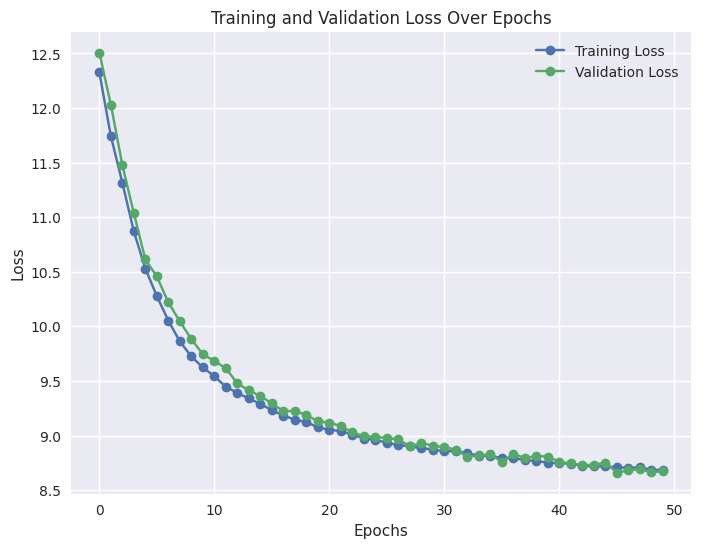

In [17]:
# TODO: Plot training and validation loss over epochs

def plot_loss(history):
    """
    Plot training and validation loss over epochs.

    Args:
        history: A dictionary containing training and validation losses.
    """
    plt.figure(figsize=(8, 6))
    plt.plot(history["train_loss"], label="Training Loss", marker='o')
    if "val_loss" in history and history["val_loss"]:
        plt.plot(history["val_loss"], label="Validation Loss", marker='o')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss Over Epochs")
    plt.legend()
    plt.grid(True)
    plt.show()
    
plot_loss(history)

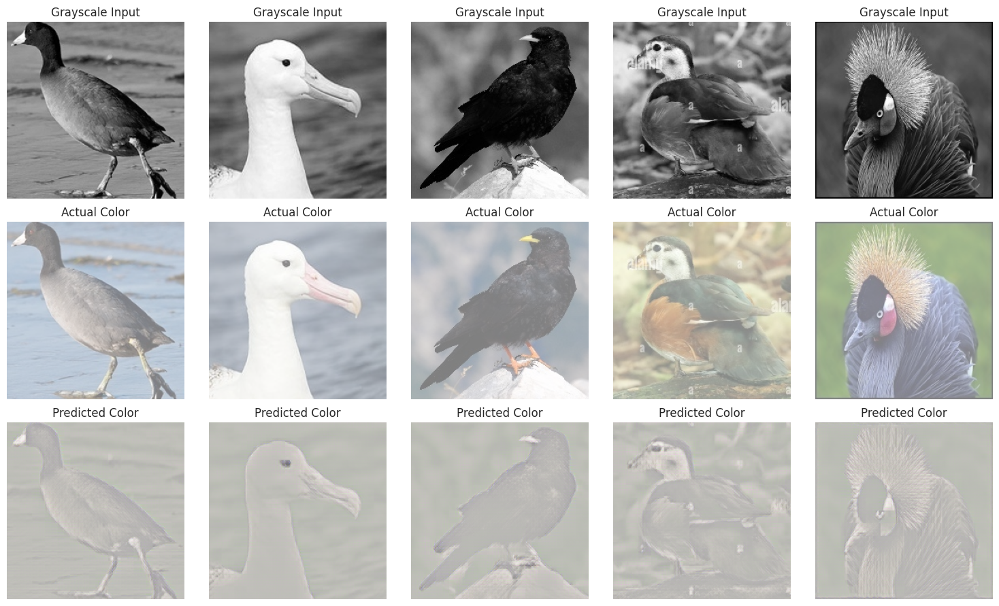

In [18]:
def visualize_results(model, data_loader, device):
    model.eval()
    with torch.no_grad():
        gray_batch, color_batch = next(iter(data_loader))
        gray_batch, color_batch = gray_batch.to(device), color_batch.to(device)
        pred_batch = model(gray_batch)

    gray_batch = gray_batch.cpu()
    color_batch = color_batch.cpu()
    pred_batch = pred_batch.cpu()

    n_samples = min(5, gray_batch.size(0))
    fig, axs = plt.subplots(3, n_samples, figsize=(3*n_samples, 9))

    for i in range(n_samples):
        # Grayscale image: shape [1, H, W]
        axs[0, i].imshow(gray_batch[i].squeeze(), cmap='gray')
        axs[0, i].axis('off')
        axs[0, i].set_title('Grayscale Input')

        # Actual color image: shape [3, H, W] normalized to [-1,1]
        actual_img = color_batch[i].permute(1, 2, 0).detach().numpy()
        actual_img = (actual_img * 0.5) + 0.5  # denormalize from [-1,1] to [0,1]
        axs[1, i].imshow(np.clip(actual_img, 0, 1))
        axs[1, i].axis('off')
        axs[1, i].set_title('Actual Color')

        # Predicted image: shape [3, H, W] normalized to [-1,1]
        pred_img = pred_batch[i].permute(1, 2, 0).detach().numpy()
        pred_img = (pred_img * 0.5) + 0.5
        axs[2, i].imshow(np.clip(pred_img, 0, 1))
        axs[2, i].axis('off')
        axs[2, i].set_title('Predicted Color')

    plt.tight_layout()
    plt.show()

visualize_results(model, val_loader, device)

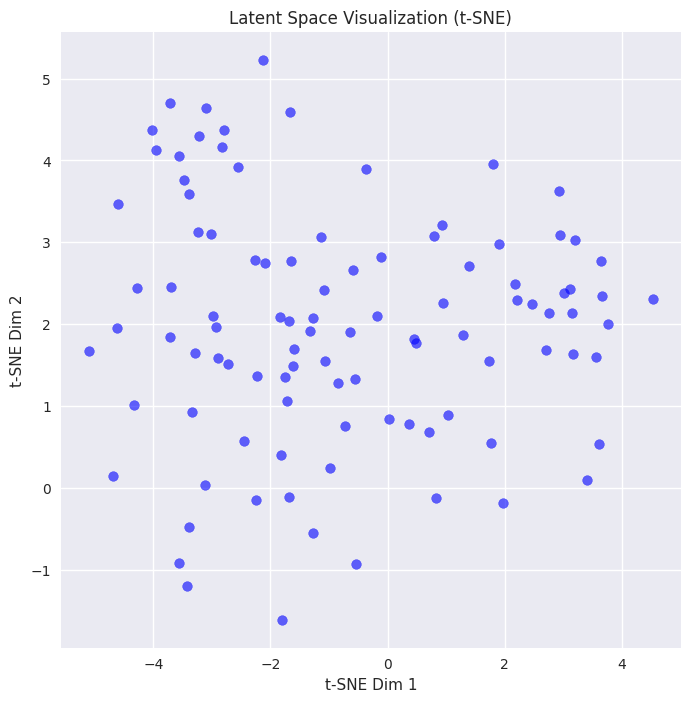

In [19]:
# Visualizing the Latent Space
# Latent space visualizations are a powerful tool to understand how the VAE encodes data.
# In this task, students are required to implement a visualization routine to observe the distribution of their data within the latent space.
# The goal is to project high-dimensional encoded data into two dimensions using t-SNE and inspect how different data points are clustered.

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.

    # TODO: Implement a loop to encode a batch of images and collect their latent representations.
    # TODO: Use t-SNE to reduce dimensions of these latent representations for visualization.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    """
    # - Set model to evaluation mode
    encoder.eval()
    # - Limit the number of samples based on the user's preference
    latent_vectors = []
    labels = []
    device = next(encoder.parameters()).device
    # - Move images to the same device as model

    # TODO: Use the encoder to get the mean (mu) of the latent distribution
    with torch.no_grad():
        for gray, color in data_loader:
            gray = gray.to(device)
            latent = encoder(gray)  # Pass images through the encoder
            latent_vectors.append(latent.view(latent.size(0), -1))  # Flatten latent vectors
            labels.extend([f"Sample {i}" for i in range(latent.size(0))])
            
            # Stop if we've collected enough samples
            if len(latent_vectors) * gray.size(0) >= num_samples:
                break
    # - Stack all obtained latent vectors

    # - t-SNE reduction to 2D for visualization

    # - Plotting the 2D projection
    latent_vectors = torch.cat(latent_vectors, dim=0)
    if latent_vectors.size(0) > num_samples:
        latent_vectors = latent_vectors[:num_samples]

    # Apply t-SNE to reduce dimensionality to 2D
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    latent_2d = tsne.fit_transform(latent_vectors.cpu().numpy())

    # Plot the 2D t-SNE projection
    plt.figure(figsize=(8, 8))
    plt.scatter(latent_2d[:, 0], latent_2d[:, 1], alpha=0.6, c='blue')
    plt.title("Latent Space Visualization (t-SNE)")
    plt.xlabel("t-SNE Dim 1")
    plt.ylabel("t-SNE Dim 2")
    plt.grid(True)
    plt.show()

# TODO: Use visualize_latent_space function post-training to observe the latent space
visualize_latent_space(net.encoder, test_loader, num_samples=1000)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?
    
    Answer: Latent space clusters often represent shared features (e.g., textures, shapes) or categories (e.g., sky, vegetation)
    Clear clustering indicates the VAE effectively captures color-relevant features, enhancing its ability to generate distinct and accurate colorizations for different inputs.

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

    Answer: Neighboring points in latent space typically yield similar outputs, reflecting smooth transitions in the latent representation.
    Smooth transitions allow for realistic color variations, handling gradual input changes like lighting or shading, improving quality and coherence of colorized outputs.

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?

    Answer: 
    Strengths: t-SNE reveals clusters and local structures, making latent space patterns interpretable in 2D.
    Limitations: It distorts global relationships and may misrepresent distances, potentially leading to incomplete interpretations of the latent structure.


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

Ans: The encoder-decoder architecture in image colorization learns complex data distributions by compressing the input grayscale image into a compact latent representation (encoder) and decoding it into a rich colorized output (decoder). The encoder extracts semantic features, while the decoder uses these features to predict plausible colors for each region, leveraging spatial and contextual information.

Unlike a simple autoencoder, which focuses on reconstructing the input, the colorization architecture:

Maps grayscale to color (input-output mismatch).
Often incorporates additional context, such as feature fusion or global priors, to infer realistic colors.
Utilizes specific loss functions (e.g., perceptual loss) tailored for color realism.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Ans: Perceptual loss enhances the quality of colorized images by comparing high-level features extracted from a pre-trained network (e.g., VGG) rather than directly comparing pixel values. This encourages the model to focus on structural and semantic fidelity, producing colorizations that are more realistic and visually appealing. \\
Comparison to losses like MSE:
1) MSE Loss: Measures pixel-wise differences, often leading to overly smooth results in colorization due to averaging of plausible color predictions.
2) Perceptual Loss: Measures similarity in the feature space of a pre-trained network, capturing texture, structure, and semantic details, making it more robust to small shifts or variations in pixel intensities. This leads to sharper and more coherent colorized outputs.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

Answer: (IMPACT) - Fidelity: A well-structured latent space ensures accurate reconstruction, preserving semantic and structural details for realistic colorizations.
Diversity: Sampling from the latent space allows varied and plausible color outputs.

(DIMENSIONALITY) - Low Dimensionality: Misses details, reducing fidelity and diversity.
High Dimensionality: Improves fidelity but may overfit noise, reducing meaningful variation and increasing complexity.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [20]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt

# import necessary PyTorch libraries
import random
from PIL import Image


print('modules loaded')

modules loaded


## Load the Dataset

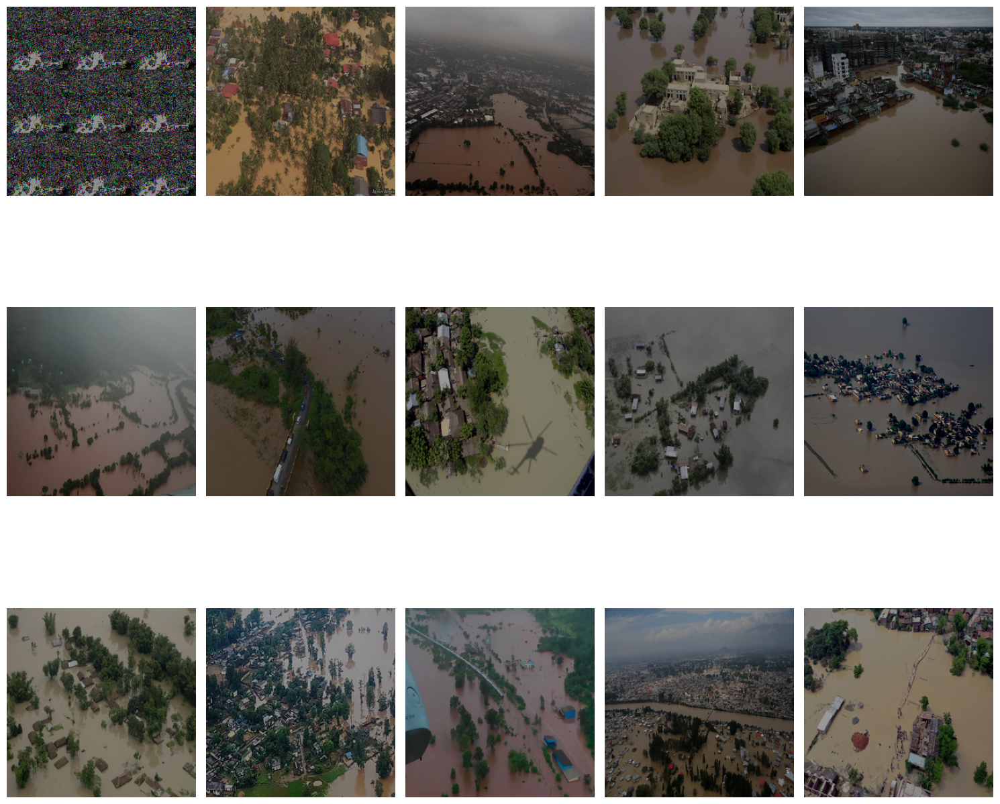

In [21]:
def create_data(data_dir):
    """
    TODO: Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    images_dir = os.path.join(data_dir, 'Image')
    masks_dir = os.path.join(data_dir, 'Mask')

    image_paths = [os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.png') or f.endswith('.jpg')]
    mask_paths = [os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.png') or f.endswith('.jpg')]

    # ensure correct pairing
    image_paths.sort()
    mask_paths.sort()

    return image_paths, mask_paths


def load_image(image_path, SIZE):
    """
    TODO: Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    image = Image.open(image_path)
    image = image.resize((SIZE, SIZE), PIL.Image.LANCZOS)
    image = np.array(image) / 255.0
    return image

def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    TODO: Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    images = []
    for i, path in enumerate(image_paths):
        if trim and i >= trim:
            break
        image = load_image(path, SIZE)

        # Ensure images have the correct shape
        if image.shape != (SIZE, SIZE, 3):
            # print(f"Warning: Image {path} has shape {image.shape}, resizing...")
            image = np.resize(image, (SIZE, SIZE, 3))

        if mask:
            # If it's a mask, ensure binary format (0 or 1 values)
            image = (image > 0.5).astype(np.uint8)  # Binarize the mask
        images.append(image)

    # Ensure all images have the same shape (handle different channels or dimensions)
    try:
        return np.array(images)
    except ValueError as e:
        print(f"Error when creating NumPy array: {e}")
        print(f"Shape of first image: {images[0].shape}")
        return np.array([])

def show_image(image, title=None, cmap=None, alpha=1):
    """
    TODO: Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.imshow(image, cmap=cmap)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    TODO: Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt.imshow(image, cmap='gray')
    plt.imshow(mask, cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()

def show_images(imgs, msks, rows=3, cols=5):
    """
    TODO: Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    fig, axs = plt.subplots(rows, cols, figsize=(15, 15))
    axs = axs.ravel()

    for i in range(min(rows * cols, len(imgs))):
        axs[i].imshow(imgs[i])
        if msks is not None and i < len(msks):
            axs[i].imshow(msks[i], alpha=0.4, cmap='jet')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()


# TODO: Load and visualize images
# data_dir = '/content/drive/MyDrive/seg_archive'
data_dir = '/kaggle/input/seg-archive/seg_archive'
SIZE = 256

image_paths, mask_paths = create_data(data_dir)

images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

show_images(images, masks, rows=3, cols=5)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
from sklearn.utils import shuffle
from PIL import Image

In [23]:
!pip install torchsummary

In [24]:
# Enhancing U-Net with Dice and Jaccard Losses for Segmentation

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        intersection = torch.sum(pred * target)
        union = torch.sum(pred) + torch.sum(target)
        dice_coeff = (2. * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice_coeff


class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        intersection = torch.sum(pred * target)
        union = torch.sum(pred) + torch.sum(target) - intersection
        jaccard_index = (intersection + self.smooth) / (union + self.smooth)
        return 1 - jaccard_index


class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, rate, pooling=True):
        super(EncoderBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(rate)
        self.pooling = pooling

        if pooling:
            self.pool = nn.MaxPool2d(2)

    def forward(self, X):
        X = self.relu(self.bn1(self.conv1(X)))
        X = self.relu(self.bn2(self.conv2(X)))
        X = self.dropout(X)
        if self.pooling:
            X = self.pool(X)
        return X


class DecoderBlock(nn.Module):
    def __init__(self, in_channels, filters, rate):
        super(DecoderBlock, self).__init__()
        self.upconv = nn.ConvTranspose2d(in_channels, filters, kernel_size=2, stride=2)

        self.conv1 = nn.Conv2d(filters + filters, filters, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(filters, filters, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(filters)
        self.bn2 = nn.BatchNorm2d(filters)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(rate)

    def forward(self, X, skip_connection):
        X = self.upconv(X)
        # print(f"X shape: {X.shape}, skip_connection shape: {skip_connection.shape}")
        X = F.interpolate(X, size=skip_connection.shape[2:], mode="bilinear", align_corners=False)
        # print(f"X shape: {X.shape}, skip_connection shape: {skip_connection.shape}")
        X = torch.cat([X, skip_connection], dim=1)
        X = self.relu(self.bn1(self.conv1(X)))
        X = self.relu(self.bn2(self.conv2(X)))
        X = self.dropout(X)
        return X





class AttentionGate(nn.Module):
    def __init__(self, filters, bn):
        super(AttentionGate, self).__init__()
        # TODO: Initialize convolutional layers and batch normalization.
        self.bn = bn

        self.W_x = nn.Sequential(
            nn.Conv2d(filters, filters, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(filters) if bn else nn.Identity()
        )

        self.psi = nn.Sequential(
            nn.Conv2d(filters, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1) if bn else nn.Identity(),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, X):
        # TODO: Implement attention mechanism with element-wise operations.
        x1 = self.W_x(X)
        if x1.shape != X.shape:
            x1 = F.interpolate(x1, size=X.shape[2:], mode="bilinear", align_corners=True)
        attention = self.psi(self.relu(x1))
        output = X * attention
        return output



class UNetModel(nn.Module):
    def __init__(self):
        super(UNetModel, self).__init__()
        self.enc1 = EncoderBlock(in_channels=3, out_channels=64, rate=0.1, pooling=True)
        self.enc2 = EncoderBlock(in_channels=64, out_channels=128, rate=0.1, pooling=True)
        self.enc3 = EncoderBlock(in_channels=128, out_channels=256, rate=0.1, pooling=True)
        self.enc4 = EncoderBlock(in_channels=256, out_channels=512, rate=0.1, pooling=True)

        self.bottleneck = EncoderBlock(in_channels=512, out_channels=1024, rate=0.1, pooling=False)

        self.dec4 = DecoderBlock(in_channels=1024, filters=512, rate=0.1)
        self.dec3 = DecoderBlock(in_channels=512, filters=256, rate=0.1)
        self.dec2 = DecoderBlock(in_channels=256, filters=128, rate=0.1)
        self.dec1 = DecoderBlock(in_channels=128, filters=64, rate=0.1)

        self.att4 = AttentionGate(filters=512, bn=True)
        self.att3 = AttentionGate(filters=256, bn=True)
        self.att2 = AttentionGate(filters=128, bn=True)
        self.att1 = AttentionGate(filters=64, bn=True)

        self.output_layer = nn.Conv2d(64, 1, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)
        e4 = self.enc4(e3)

        b = self.bottleneck(e4)

        d4 = self.dec4(b, self.att4(e4))
        d3 = self.dec3(d4, self.att3(e3))
        d2 = self.dec2(d3, self.att2(e2))
        d1 = self.dec1(d2, self.att1(e1))

        seg_output = torch.sigmoid(self.output_layer(d1))
        return seg_output


    def compute_loss(self, pred, target):
        """
        Calculate the combined segmentation loss using Dice and Jaccard losses.
        - pred: predicted probability maps
        - target: ground truth probability maps
        """
        dice_loss = DiceLoss()(pred, target)
        jaccard_loss = JaccardLoss()(pred, target)
        loss = dice_loss + jaccard_loss
        return loss


# Model instantiation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNetModel().to(device)

learning_rate = 0.001
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

from torchsummary import summary
summary(model, input_size=(3, 256, 256))

model.train()

model.eval()

sample_input = torch.randn(1, 3, 256, 256).to(device)
output = model(sample_input)
print("Output shape:", output.shape)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
           Dropout-7         [-1, 64, 256, 256]               0
         MaxPool2d-8         [-1, 64, 128, 128]               0
      EncoderBlock-9         [-1, 64, 128, 128]               0
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
             ReLU-12        [-1, 128, 128, 128]               0
           Conv2d-13        [-1, 128, 128, 128]         147,584
      BatchNorm2d-14        [-1, 128, 1

## Training

In [25]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from torchvision.transforms import ToTensor
import numpy as np
import os
from PIL import Image

def load_image(image_path, SIZE):
    image = Image.open(image_path)
    image = image.resize((SIZE, SIZE), Image.LANCZOS)
    return np.array(image) / 255.0  # Normalize

def create_data(data_dir):
    images_dir = os.path.join(data_dir, 'Image')
    masks_dir = os.path.join(data_dir, 'Mask')

    image_paths = [os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith(('.png', '.jpg'))]
    mask_paths = [os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith(('.png', '.jpg'))]

    image_paths.sort()
    mask_paths.sort()

    return image_paths, mask_paths

class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = load_image(self.image_paths[idx], SIZE)
        mask = load_image(self.mask_paths[idx], SIZE)

        # Ensure images are in RGB format (3 channels)
        if len(image.shape) == 2:  # Grayscale, replicate channels
            image = np.stack([image] * 3, axis=-1)
        elif image.shape[-1] == 4:  # RGBA, discard alpha
            image = image[:, :, :3]

        if len(mask.shape) == 3:  # If mask has multiple channels, reduce to 1
            mask = mask[:, :, 0]

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        else:
            image = torch.tensor(image.transpose((2, 0, 1)), dtype=torch.float32)  # HWC -> CHW
            mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)  # Add channel dimension for mask

        return image, mask


SIZE = 256  # Image size (ensure it's consistent with your dataset)

image_paths, mask_paths = create_data(data_dir)

train_image_paths, val_image_paths, train_mask_paths, val_mask_paths = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=42
)

train_dataset = SegmentationDataset(train_image_paths, train_mask_paths, transform=ToTensor())
val_dataset = SegmentationDataset(val_image_paths, val_mask_paths, transform=ToTensor())

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

model = UNetModel() 
model = model.to('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.BCEWithLogitsLoss()  # Binary Cross Entropy with Logits
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 40
device = 'cuda' if torch.cuda.is_available() else 'cpu'

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

import matplotlib.pyplot as plt

for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    train_correct = 0
    train_total = 0

    for batch_idx, (images, masks) in enumerate(train_loader):
        images, masks = images.float().to(device), masks.float().to(device)

        outputs = model(images)

        if outputs.size() != masks.size():
            outputs = F.interpolate(outputs, size=masks.size()[2:], mode='bilinear', align_corners=False)

        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

        preds = (outputs > 0.5).float()
        train_correct += (preds == masks).sum().item()
        train_total += masks.numel()

    train_losses.append(train_loss / len(train_loader))
    train_accuracies.append(train_correct / train_total)

    model.eval()
    val_loss = 0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.float().to(device), masks.float().to(device)

            outputs = model(images)

            if outputs.size() != masks.size():
                outputs = F.interpolate(outputs, size=masks.size()[2:], mode='bilinear', align_corners=False)

            loss = criterion(outputs, masks)
            val_loss += loss.item()

            # Calculate accuracy
            preds = (outputs > 0.5).float()
            val_correct += (preds == masks).sum().item()
            val_total += masks.numel()

    val_losses.append(val_loss / len(val_loader))
    val_accuracies.append(val_correct / val_total)

    print(f"Epoch {epoch + 1}/{num_epochs}, "
          f"Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accuracies[-1]:.4f}, "
          f"Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}")

# Save model
torch.save(model.state_dict(), "unet_segmentation_model.pth")
print("Model saved.")

Epoch 1/40, Train Loss: 0.6741, Train Acc: 0.7346, Val Loss: 0.8951, Val Acc: 0.3529
Epoch 2/40, Train Loss: 0.6382, Train Acc: 0.7793, Val Loss: 0.8321, Val Acc: 0.4277
Epoch 3/40, Train Loss: 0.6239, Train Acc: 0.7918, Val Loss: 0.6954, Val Acc: 0.7059
Epoch 4/40, Train Loss: 0.6150, Train Acc: 0.7969, Val Loss: 0.6473, Val Acc: 0.7664
Epoch 5/40, Train Loss: 0.6196, Train Acc: 0.7814, Val Loss: 0.6442, Val Acc: 0.7711
Epoch 6/40, Train Loss: 0.6158, Train Acc: 0.7801, Val Loss: 0.6209, Val Acc: 0.7843
Epoch 7/40, Train Loss: 0.6067, Train Acc: 0.7993, Val Loss: 0.6137, Val Acc: 0.7924
Epoch 8/40, Train Loss: 0.6020, Train Acc: 0.8110, Val Loss: 0.6499, Val Acc: 0.7605
Epoch 9/40, Train Loss: 0.6056, Train Acc: 0.8029, Val Loss: 0.6409, Val Acc: 0.7693
Epoch 10/40, Train Loss: 0.6019, Train Acc: 0.8047, Val Loss: 0.6183, Val Acc: 0.7942
Epoch 11/40, Train Loss: 0.6013, Train Acc: 0.8045, Val Loss: 0.6179, Val Acc: 0.7981
Epoch 12/40, Train Loss: 0.6026, Train Acc: 0.8027, Val Loss: 0

In [26]:
print(train_losses)

print(val_losses)

print(train_accuracies)

print(val_accuracies)

[0.6740727345148723, 0.6381948908170064, 0.623876961072286, 0.6149968465169271, 0.619615372021993, 0.6157764514287313, 0.6067427873611451, 0.6019801656405132, 0.6055532296498617, 0.6018534104029337, 0.6013084014256795, 0.6025760849316915, 0.6004370172818502, 0.602544101079305, 0.5973236997922261, 0.59398858944575, 0.5972767273585001, 0.6008507529894511, 0.5978097279866537, 0.592134932676951, 0.599480394522349, 0.5915404677391052, 0.5965895692507426, 0.5922990759213765, 0.592207137743632, 0.5927803874015808, 0.5990131934483846, 0.5886634826660156, 0.5895814498265585, 0.5860223650932312, 0.5872312823931376, 0.5890427271525065, 0.589018460114797, 0.5862343112627665, 0.5907006740570069, 0.5880710005760192, 0.5885663747787475, 0.585945995648702, 0.5869546413421631, 0.5849498748779297]
[0.8950643986463547, 0.8320756256580353, 0.6954210698604584, 0.6472587734460831, 0.6442196667194366, 0.6209038347005844, 0.6137469410896301, 0.6498676091432571, 0.6408629566431046, 0.6183497756719589, 0.617862

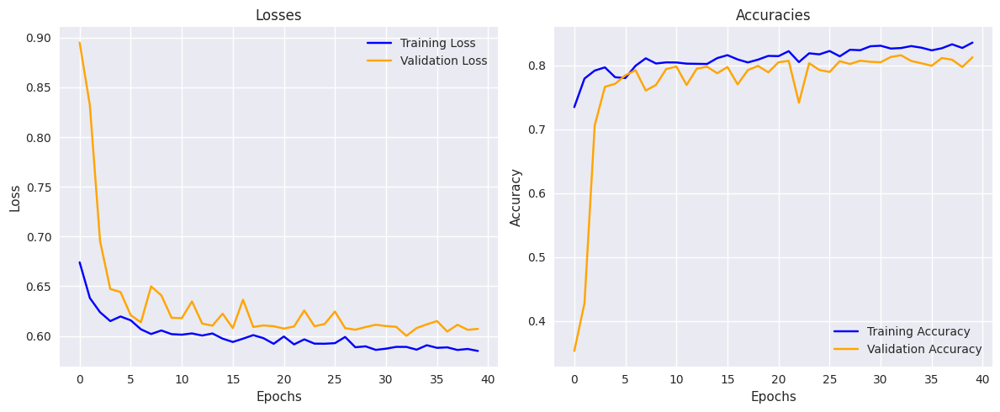

In [27]:
# TODO: Plot training and validation losses and accuracies

# Plot training and validation losses
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='orange')
plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy', color='blue')
plt.plot(val_accuracies, label='Validation Accuracy', color='orange')
plt.title('Accuracies')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


## Plottings

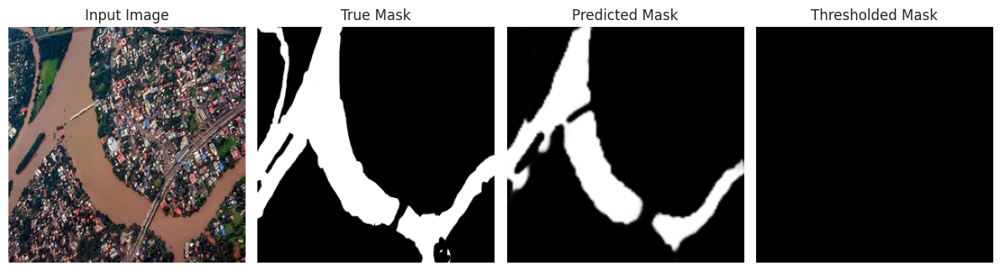

In [28]:
# Plot the original mask, the one you predicted, and the final one using a threshold

import matplotlib.pyplot as plt

# Function to visualize masks
def visualize_masks(image, true_mask, predicted_mask, thresholded_mask):
    plt.figure(figsize=(12, 4))

    # input image
    plt.subplot(1, 4, 1)
    plt.imshow(image.permute(1, 2, 0).cpu().numpy())  # CHW to HWC
    plt.title('Input Image')
    plt.axis('off')

    # true mask
    plt.subplot(1, 4, 2)
    plt.imshow(true_mask.squeeze().cpu().numpy(), cmap='gray')
    plt.title('True Mask')
    plt.axis('off')

    # predicted mask
    plt.subplot(1, 4, 3)
    plt.imshow(predicted_mask.squeeze().cpu().numpy(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    # thresholded mask
    plt.subplot(1, 4, 4)
    plt.imshow(thresholded_mask.squeeze().cpu().numpy(), cmap='gray')
    plt.title('Thresholded Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

model.eval()
with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.float().to(device), masks.float().to(device)

        # Predict masks
        outputs = model(images)
        if outputs.size() != masks.size():
            outputs = F.interpolate(outputs, size=masks.size()[2:], mode='bilinear', align_corners=False)

        # Apply threshold
        thresholded_outputs = (outputs > 0).float()

        # Visualize the first sample from the batch
        visualize_masks(
            images[0],                  # Original image
            masks[0],                   # True mask
            outputs[0].sigmoid(),       # Predicted mask (after applying sigmoid)
            thresholded_outputs[0]      # Thresholded mask
        )
        break  # only one example


In [29]:
def plot_overlay_masks_fixed(model, dataset, num_samples=5, threshold=0.5, alpha=0.5):
    """
    Plots the original image, predicted mask, and the overlay of mask on the image.
    Args:
        model: Trained segmentation model.
        dataset: Dataset object containing images and masks.
        num_samples: Number of samples to plot (default: 5).
        threshold: Threshold to binarize the predicted mask (default: 0.5).
        alpha: Transparency of the overlay mask (default: 0.5).
    """
    import random
    import matplotlib.pyplot as plt
    import torch
    import torch.nn.functional as F
    import numpy as np

    model.eval()  
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        # Randomly select a sample
        idx = random.randint(0, len(dataset) - 1)
        image, original_mask = dataset[idx]

        image = image.to(device).float().unsqueeze(0) 
        original_mask = original_mask.to(device).float()

        with torch.no_grad():
            predicted_mask = model(image)

        if predicted_mask.size(2) != original_mask.size(1) or predicted_mask.size(3) != original_mask.size(2):
            predicted_mask = F.interpolate(predicted_mask, size=(original_mask.size(1), original_mask.size(2)), 
                                           mode='bilinear', align_corners=False)

        predicted_mask = predicted_mask.squeeze(0).squeeze(0).cpu().numpy() 
        predicted_mask = (predicted_mask > threshold).astype(np.float32) 

        overlay_mask = np.stack([predicted_mask] * 3, axis=-1)

        image = image.squeeze().permute(1, 2, 0).cpu().numpy()  # Convert CHW to HWC

        axes[i, 0].imshow(image)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(predicted_mask, cmap="gray")
        axes[i, 1].set_title("Predicted Mask")
        axes[i, 1].axis("off")

        blended = (1 - alpha) * image + alpha * overlay_mask 
        axes[i, 2].imshow(blended)
        axes[i, 2].set_title("Overlay Mask")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

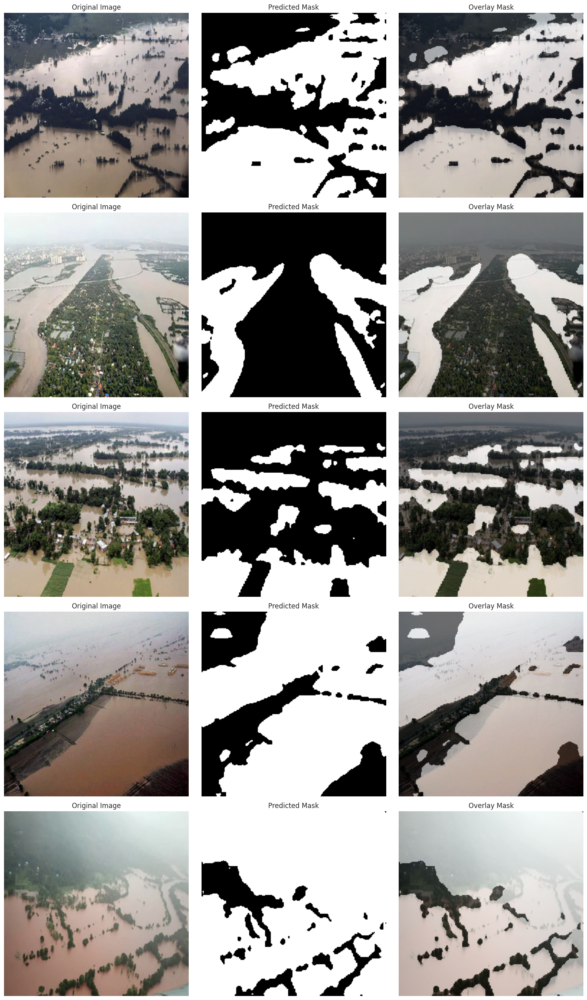

In [30]:
plot_overlay_masks_fixed(model, val_dataset, num_samples=5, threshold=0.5, alpha=0.5)

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

    Answer: 
First question ||||| Dice/Jaccard Losses: Focus on overlap between predicted and true segmentations, reducing sensitivity to class imbalances as they directly measure the quality of segmentation for small or imbalanced regions.
Cross-Entropy (CE): Computes pixel-wise probabilities; prone to being biased by dominant classes, leading to poor performance on minority classes.
Mean Squared Error (MSE): Less common in segmentation, measures pixel-wise differences; not inherently designed for handling class imbalances.

Second Question |||| Dice/Jaccard Losses: Directly maximize spatial overlap, making them better suited for segmentation tasks where boundary precision and region matching are critical.
CE/MSE: Do not explicitly optimize for spatial overlap, focusing instead on pixel-wise accuracy or intensity differences.

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

    Answer:
    
High Loss:
Indicates poor segmentation performance.
Potential reasons: underfitting, improper model architecture, or class imbalance issues.

Low Loss:
Suggests better alignment between predicted and true segmentations.
May not always imply perfect segmentation, especially if the loss function fails to capture nuanced spatial details or boundary precision (e.g., for small regions).

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

Ans: The attention mechanism enhances segmentation accuracy in cluttered environments by focusing on relevant features while suppressing irrelevant or noisy information. It dynamically assigns higher weights to critical regions in the input, allowing the model to distinguish objects of interest from the background or clutter. This refinement improves spatial context awareness, sharpens boundaries, and ensures better handling of complex scenes with overlapping or small objects.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

Ans: Skip connections in U-Net link the encoder and decoder layers, transferring high-resolution spatial features from early layers directly to later upsampling layers. This preserves fine-grained details lost during downsampling, improving boundary accuracy and feature localization. They enhance segmentation performance, especially for small or intricate structures, by combining low-level details with high-level semantic context.

Explain the difference between the predicted and processed mask above.

Ans: The predicted mask is the direct output of the segmentation model, typically containing raw probabilities (in the case of soft outputs) or class assignments (in hard outputs). It may include noise, artifacts, or disconnected regions.

The processed mask results from applying post-processing techniques (e.g., thresholding, morphological operations, or connected component analysis) to clean and refine the predicted mask. Processing helps remove spurious predictions, fill gaps, or ensure that the mask adheres to desired constraints, such as size or connectivity. This improves the mask's usability for downstream tasks.